## TUTORIAL 12 - Stokes Equations
**_Keywords: geometrical parametrization, POD-Galerkin method, mixed formulation, inf sup condition_**

### 1. Introduction

This tutorial addresses geometrical parametrization and the POD-Galerkin method applied to the steady Stokes equations in a domain $\Omega_o \subset \mathbb{R}^2$ divided into 4 parts with boundary $\Gamma_o$.

The problem is characterized by six parameters. We introduce a vector of parameters $\boldsymbol{\mu} = \{t,D,L,S,H,\theta \}$ that control the shape of the subdomains. The ranges of the six parameters are the following:

The parameter vector $\boldsymbol{\mu}$ is thus given by $$\boldsymbol{\mu}=(\mu_0,\mu_1,\mu_2,\mu_3,\mu_4,\mu_5)$$ which corresponds to $\boldsymbol{\mu} = \{t,D,L,S,H,\theta \}$, respectively, on the parameter domain $$\mathbb{P}=[0.5,1.5]\times[0.5,1.5]\times[0.5,1.5]\times[0.5,1.5]\times[0.5,1.5]\times[0,\pi/6]$$

In this program, we apply the following conditions on the boundaries: 
* Zero velocity on the left boundary $\Gamma_{o,w}$ 
* Constant inflow on the right boundary $\Gamma_{o,in}$
* Stress free Neumann condition on the bottom boundary $\Gamma_{o,out}$

In order to obtain a faster approximation of the problem we pursue a model reduction by means of a POD-Galerkin reduced order method from a fixed reference domain.



### 2. Parametrized formulation

Let $\boldsymbol{u_o}(\boldsymbol{\mu})$ be the velocity vector and $p_o(\boldsymbol{\mu})$ be the pressure in the domain $\Omega_o(\boldsymbol{\mu})$.

We will directly provide a weak formulation for this problem:
for a given parameter $\boldsymbol{\mu} \in\mathbb{P}$, find $\boldsymbol{u_o}(\boldsymbol{\mu}) \in\mathbb{V_o}(\boldsymbol{\mu})$, $p_o \in\mathbb{M_o}$ such that 

<center>
    $
    \begin{cases}
        \nu \int_{\Omega_o} \nabla \boldsymbol{u_o} : \nabla \boldsymbol{v_o} \ d\Omega - \int_{\Omega_o} p_o \nabla \cdot \boldsymbol{v_o} \ d\Omega = \int_{\Omega_o} \boldsymbol{f_o} \cdot \boldsymbol{v_o} \ d\Omega, \quad \forall \boldsymbol{v_o} \in\mathbb{V_o},  \\
        \int_{\Omega_o} q_o \nabla \cdot \boldsymbol{u_o} \ d\Omega = 0, \quad \forall q_o \in\mathbb{M_o}
    \end{cases}
    $
</center>

where

* $\nu$ represents kinematic viscosity
* the functional space $\mathbb{V_o}(\boldsymbol{\mu})$ is defined as $$\mathbb{V_o}(\boldsymbol{\mu}) = [H_{\Gamma_{o,w}}^{1}(\Omega_o)]^2$$
* the functional space $\mathbb{M_o}(\boldsymbol{\mu})$ is defined as $$\mathbb{M_o}(\boldsymbol{\mu}) = L^2(\Omega_o)$$ Note that the functional spaces are parameter dependent due to the shape variation

Since this problem utilizes mixed finite element discretization with the velocity and pressure as solution variables, the inf-sup condition is necessary for the well posedness of this problem. Thus, the supremizer operator $T^{\mu}: \mathbb{M_o}_h \rightarrow \mathbb{V_o}_h$ will be used.


In [1]:
import os
import sys
sys.path.append('../../')

from mlnics import NN, Losses, Normalization, RONNData, IO, Training, ErrorAnalysis
from dolfin import *
from rbnics import *
from sampling import LinearlyDependentUniformDistribution
import torch
import numpy as np
import matplotlib.pyplot as plt

torch.manual_seed(0)
np.random.seed(0)

## 3. Affine decomposition

In order to obtain an affine decomposition, we recast the problem on a fixed, parameter independent, reference domain $\Omega$. We choose one characterized by $\mu_0=\mu_1=\mu_2=\mu_3=\mu_4=1$ and $\mu_5=0$, which we generate through the generate_mesh notebook provided in the *data* folder. 



In [2]:
@PullBackFormsToReferenceDomain()
@AffineShapeParametrization("data/t_bypass_vertices_mapping.vmp")
class Stokes(StokesProblem):

    # Default initialization of members
    def __init__(self, V, **kwargs):
        # Call the standard initialization
        StokesProblem.__init__(self, V, **kwargs)
        # ... and also store FEniCS data structures for assembly
        assert "subdomains" in kwargs
        assert "boundaries" in kwargs
        self.subdomains, self.boundaries = kwargs["subdomains"], kwargs["boundaries"]
        up = TrialFunction(V)
        (self.u, self.p) = split(up)
        vq = TestFunction(V)
        (self.v, self.q) = split(vq)
        self.dx = Measure("dx")(subdomain_data=self.subdomains)
        self.ds = Measure("ds")(subdomain_data=self.boundaries)
        #
        self.f = Constant((0.0, -10.0))
        self.g = Constant(0.0)

    # Return custom problem name
    def name(self):
        return "Stokes1POD"

    # Return theta multiplicative terms of the affine expansion of the problem.
    @compute_theta_for_supremizers
    def compute_theta(self, term):
        if term == "a":
            theta_a0 = 1.0
            return (theta_a0, )
        elif term in ("b", "bt"):
            theta_b0 = 1.0
            return (theta_b0, )
        elif term == "f":
            theta_f0 = 1.0
            return (theta_f0, )
        elif term == "g":
            theta_g0 = 1.0
            return (theta_g0, )
        else:
            raise ValueError("Invalid term for compute_theta().")

    # Return forms resulting from the discretization of the affine expansion of the problem operators.
    @assemble_operator_for_supremizers
    def assemble_operator(self, term):
        dx = self.dx
        if term == "a":
            u = self.u
            v = self.v
            a0 = inner(grad(u), grad(v)) * dx
            return (a0, )
        elif term == "b":
            u = self.u
            q = self.q
            b0 = - q * div(u) * dx
            return (b0, )
        elif term == "bt":
            p = self.p
            v = self.v
            bt0 = - p * div(v) * dx
            return (bt0, )
        elif term == "f":
            v = self.v
            f0 = inner(self.f, v) * dx
            return (f0, )
        elif term == "g":
            q = self.q
            g0 = self.g * q * dx
            return (g0, )
        elif term == "dirichlet_bc_u":
            bc0 = [DirichletBC(self.V.sub(0), Constant((0.0, 0.0)), self.boundaries, 3)]
            return (bc0, )
        elif term == "inner_product_u":
            u = self.u
            v = self.v
            x0 = inner(grad(u), grad(v)) * dx
            return (x0, )
        elif term == "inner_product_p":
            p = self.p
            q = self.q
            x0 = inner(p, q) * dx
            return (x0, )
        else:
            raise ValueError("Invalid term for assemble_operator().")

## 4. Main program
### 4.1. Read the mesh for this problem
The mesh was generated by the [data/generate_mesh.ipynb](data/generate_mesh.ipynb) notebook.

In [3]:
mesh = Mesh("data/t_bypass.xml")
subdomains = MeshFunction("size_t", mesh, "data/t_bypass_physical_region.xml")
boundaries = MeshFunction("size_t", mesh, "data/t_bypass_facet_region.xml")

### 4.2. Create Finite Element space (Taylor-Hood P2-P1)

In [4]:
element_u = VectorElement("Lagrange", mesh.ufl_cell(), 2)
element_p = FiniteElement("Lagrange", mesh.ufl_cell(), 1)
element = MixedElement(element_u, element_p)
V = FunctionSpace(mesh, element, components=[["u", "s"], "p"])

### 4.3. Allocate an object of the Stokes class

In [5]:
problem = Stokes(V, subdomains=subdomains, boundaries=boundaries)
mu_range = [
    (0.5, 1.5),
    (0.5, 1.5),
    (0.5, 1.5),
    (0.5, 1.5),
    (0.5, 1.5),
    (0., pi / 6.)
]
problem.set_mu_range(mu_range)

### 4.4. Prepare reduction with a POD-Galerkin method

In [6]:
reduction_method = PODGalerkin(problem)
reduction_method.set_Nmax(25)
reduction_method.set_tolerance(1e-6)

### 4.5. Perform the offline phase

#### 4.5.1 Fit Reduction Method

In [7]:
reduction_method.initialize_training_set(500, sampling=LinearlyDependentUniformDistribution())
reduced_problem = reduction_method.offline()

#### 4.5.2 Train Greedy PDNN-PINN

It seems that increasing the number of parameters for which we compute residuals each iteration improves the training in that the training loss does not become too much worse in the long term as we add new training data. However, this is more memory intensive. Also note that we have a large number of basis functions in the reduced basis, so we must increase the capacity of the neural network.

In [8]:
input_normalization_pdnn = Normalization.MinMaxNormalization(input_normalization=True)
output_normalization_pdnn = Normalization.MinMaxNormalization()

pdnn_net  = NN.RONN("PDNN", problem, reduction_method, n_hidden=2, n_neurons=200)
pdnn_loss = Losses.PDNN_Loss(pdnn_net, output_normalization_pdnn)
data      = RONNData.RONNDataLoader(pdnn_net, validation_proportion=0.2)
optimizer = torch.optim.Adam(pdnn_net.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.9999)

pdnn_trainer = Training.PDNNTrainer(
    pdnn_net, data, pdnn_loss, optimizer, scheduler,
    input_normalization_pdnn, num_epochs=10000
)

loaded, starting_epoch = IO.initialize_parameters(
    pdnn_net, data, pdnn_trainer, optimizer
)

In [9]:
n = 100000 # number of parameters for which we compute residuals each iteration
num_new_params = 5 # number of parameters with which we augment data each iteration
assert num_new_params <= n

# train PDNN
print("Initial training...")
pdnn_trainer.train()

new_parameters = pdnn_net.augment_parameters_with_time(
        RONNData.get_new_parameters(pdnn_net, n)
)

print("Assembling residuals...")
residuals, _, loss_functions = ErrorAnalysis.get_residuals(
    pdnn_net, data, new_parameters, 
    input_normalization_pdnn, output_normalization_pdnn,
    plot_residuals=False
)


print("Beginning data augmentation cycles...")
for i in range(9):
    probabilities = residuals
    probabilities /= np.sum(probabilities)
    sample_indices = np.random.choice(residuals.shape[0], size=residuals.shape[0],
                                      replace=False, p=probabilities)
    cumulative_probs = np.cumsum(probabilities[sample_indices])
    #last_index = np.searchsorted(cumulative_probs, 0.25) + 1
    #sample_indices = sample_indices[:last_index]
    sample_indices = sample_indices[:num_new_params]
    high_residual_params = new_parameters[sample_indices]
    
    # solve reduced PDE system for parameters found above and augment training data
    for j, mu in enumerate(high_residual_params):
        reduced_problem.set_mu(tuple(np.array(mu)))
        reduced_problem.solve()
        solution = torch.tensor(np.array(reduced_problem._solution.vector()[:])).view(-1, 1)
        pdnn_loss.concatenate_snapshots(solution)
        
    data.train_data = torch.cat([data.train_data, high_residual_params])
    
    # train PDNN
    pdnn_trainer.train()
    
    residuals, _, _ = ErrorAnalysis.get_residuals(
        pdnn_net, data, new_parameters, 
        input_normalization_pdnn, output_normalization_pdnn,
        loss_functions, plot_residuals=False
    )

Initial training...
0 0.13926287663357637 	Loss(validation) = 0.11363888436588152
100 0.04462800390026691 	Loss(validation) = 0.04422361764206884
200 0.017020985548297184 	Loss(validation) = 0.018470102568938003
300 0.008147663438562528 	Loss(validation) = 0.010487160006934766
400 0.004898780506843092 	Loss(validation) = 0.00708947533156309
500 0.003256381341668092 	Loss(validation) = 0.00524835875909749
600 0.002356029622054011 	Loss(validation) = 0.004124961727983028
700 0.0018744576862128272 	Loss(validation) = 0.0034634757425067463
800 0.0014449435984640682 	Loss(validation) = 0.0029034155724657596
900 0.0012068307991779856 	Loss(validation) = 0.0025559393845987544
1000 0.0010249395226377361 	Loss(validation) = 0.0022842076518162784
1100 0.0008935000142951005 	Loss(validation) = 0.002073718503768194
1200 0.0007990204763638601 	Loss(validation) = 0.0019219882346091686
1300 0.0007174552059769001 	Loss(validation) = 0.0017490884354956038
1400 0.0007589480835933831 	Loss(validation) = 

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restrict

19000 5.646991480596055e-05 	Loss(validation) = 0.0003807447144950875
19100 6.904258486256111e-05 	Loss(validation) = 0.0003946541020317176
19200 5.55307319608894e-05 	Loss(validation) = 0.00037751283569121706
19300 5.504335564775984e-05 	Loss(validation) = 0.0003757480373169755
19400 5.6052361222744836e-05 	Loss(validation) = 0.00038004783724853016
19500 6.530737314522605e-05 	Loss(validation) = 0.0003965243777239932
19600 5.4844354177171734e-05 	Loss(validation) = 0.00036997567404371666
19700 5.3230469019163856e-05 	Loss(validation) = 0.00036987804070222693
19800 6.113813048692013e-05 	Loss(validation) = 0.0003772634585001796
19900 5.380245991538773e-05 	Loss(validation) = 0.00037243392551468304
20000 0.01282458901302966 	Loss(validation) = 0.002301152148711415
20100 0.005746610862762533 	Loss(validation) = 0.0019263207929449103
20200 0.0031579241393253615 	Loss(validation) = 0.0016305226428510284
20300 0.0019448487420005939 	Loss(validation) = 0.001409382111724833
20400 0.0012902786

30700 0.004351849163609003 	Loss(validation) = 0.002597086045086032
30800 0.0036499583110320786 	Loss(validation) = 0.002423651579987785
30900 0.003096862498199291 	Loss(validation) = 0.002269449312579837
31000 0.002653265957625908 	Loss(validation) = 0.0021320337836766606
31100 0.00229240877972983 	Loss(validation) = 0.0020095990075479583
31200 0.001995400200383799 	Loss(validation) = 0.0019005817475585805
31300 0.0017484884724168544 	Loss(validation) = 0.0018035224081377039
31400 0.00154143962185571 	Loss(validation) = 0.0017168188727467728
31500 0.0013664956305251019 	Loss(validation) = 0.0016390458659784161
31600 0.0012176836882799738 	Loss(validation) = 0.0015690053281607992
31700 0.0010903400329915099 	Loss(validation) = 0.001505335574910984
31800 0.0009807893144864073 	Loss(validation) = 0.0014472058468899996
31900 0.0008860818801255214 	Loss(validation) = 0.0013937683119718577
32000 0.000803833956361746 	Loss(validation) = 0.001344416880193252
32100 0.0007321151841984288 	Loss(

42500 0.004153369492808097 	Loss(validation) = 0.001855430504699266
42600 0.003877440514498809 	Loss(validation) = 0.0018189992878192712
42700 0.0036205393800829502 	Loss(validation) = 0.0017828617346179912
42800 0.0033811851409656347 	Loss(validation) = 0.0017470571083388967
42900 0.003158096662207143 	Loss(validation) = 0.0017115896751874616
43000 0.002950179216526897 	Loss(validation) = 0.0016764956918802064
43100 0.002756483054088993 	Loss(validation) = 0.001641771424007425
43200 0.0025760950866218534 	Loss(validation) = 0.0016074355324701814
43300 0.002408141821865335 	Loss(validation) = 0.0015734989455038774
43400 0.0022517533143261697 	Loss(validation) = 0.0015399836021949857
43500 0.002106077895676918 	Loss(validation) = 0.0015069145814536995
43600 0.001970300976685109 	Loss(validation) = 0.001474339507729023
43700 0.0018436369206203938 	Loss(validation) = 0.0014422870160637597
43800 0.001725378647944066 	Loss(validation) = 0.0014107512729724745
43900 0.001614949614566264 	Loss

54400 0.07362688730476614 	Loss(validation) = 0.005814958771811337
54500 0.07248809488283377 	Loss(validation) = 0.005811046213860748
54600 0.07136483681034585 	Loss(validation) = 0.005806275579044906
54700 0.07025822354860148 	Loss(validation) = 0.005800254399665308
54800 0.06917005717250792 	Loss(validation) = 0.005792691326596312
54900 0.06810233547946423 	Loss(validation) = 0.005783366322106014
55000 0.06705688254356036 	Loss(validation) = 0.00577216494717458
55100 0.06603524550077539 	Loss(validation) = 0.005759063724688386
55200 0.06503868597607254 	Loss(validation) = 0.005744106914102794
55300 0.06406762406952089 	Loss(validation) = 0.00572740803863556
55400 0.06312223879856937 	Loss(validation) = 0.0057091070023513775
55500 0.062202240730010086 	Loss(validation) = 0.0056893938857717884
55600 0.06130688519841132 	Loss(validation) = 0.0056684313610007074
55700 0.060435437880557906 	Loss(validation) = 0.005646398813079747
55800 0.059586887873555844 	Loss(validation) = 0.0056234621

66600 0.02524026899732301 	Loss(validation) = 0.004286120599949895
66700 0.025090021095088195 	Loss(validation) = 0.004273433193803009
66800 0.024941696576839326 	Loss(validation) = 0.00426085795601764
66900 0.024795245703864984 	Loss(validation) = 0.004248398871946923
67000 0.024650512027614917 	Loss(validation) = 0.004236049022579687
67100 0.02450771359168041 	Loss(validation) = 0.004223817435039742
67200 0.02436688468926107 	Loss(validation) = 0.004211716550605411
67300 0.0242279953298958 	Loss(validation) = 0.004199725816328632
67400 0.02409086542520515 	Loss(validation) = 0.00418785038128288
67500 0.023955583866902257 	Loss(validation) = 0.004176100564258484
67600 0.023822089065044235 	Loss(validation) = 0.004164455157871881
67700 0.023690545644843325 	Loss(validation) = 0.004152933795199894
67800 0.02356085071075273 	Loss(validation) = 0.004141535434144389
67900 0.023433010219286055 	Loss(validation) = 0.004130263747653573
68000 0.023306839656408677 	Loss(validation) = 0.00411911

78900 0.05076114579652183 	Loss(validation) = 0.005933516472590916
79000 0.05057339285860566 	Loss(validation) = 0.005941310392433609
79100 0.05038829878574896 	Loss(validation) = 0.005948953175146388
79200 0.05020582477978953 	Loss(validation) = 0.005956478440375635
79300 0.05002602718680492 	Loss(validation) = 0.005963821839522848
79400 0.04984876106009432 	Loss(validation) = 0.005971063041897558
79500 0.04967416441801938 	Loss(validation) = 0.005978196835611223
79600 0.049502143977545314 	Loss(validation) = 0.0059851980314733115
79700 0.04933256410089723 	Loss(validation) = 0.005992075515671117
79800 0.04916546216032685 	Loss(validation) = 0.005998835145002954
79900 0.049000759662831725 	Loss(validation) = 0.0060055161302709215
80000 0.0779751397099894 	Loss(validation) = 0.006042287662180069
80100 0.07742122093964315 	Loss(validation) = 0.00607897302107326
80200 0.07696330380638661 	Loss(validation) = 0.006109993454296091
80300 0.0765589927684607 	Loss(validation) = 0.0061378555416

91200 0.2692242567966411 	Loss(validation) = 0.007266854393746646
91300 0.2689562908367271 	Loss(validation) = 0.0072705693727968205
91400 0.26869372685262394 	Loss(validation) = 0.007274316282544516
91500 0.2684354137649893 	Loss(validation) = 0.007277862241611913
91600 0.2681819134872521 	Loss(validation) = 0.007281223471377038
91700 0.26793402356045 	Loss(validation) = 0.007284549240104218
91800 0.2676916411480349 	Loss(validation) = 0.007287827858215867
91900 0.2674537842532277 	Loss(validation) = 0.00729103221198217
92000 0.2672204451787984 	Loss(validation) = 0.007294032402728549
92100 0.2669916284204006 	Loss(validation) = 0.007297030862519791
92200 0.2667669421418289 	Loss(validation) = 0.007300070038492051
92300 0.2665458976428677 	Loss(validation) = 0.007303081799292287
92400 0.2663283538022874 	Loss(validation) = 0.007306026134687714
92500 0.26611409963971094 	Loss(validation) = 0.007308909560026511
92600 0.26590339694489207 	Loss(validation) = 0.007311706405602134
92700 0.2

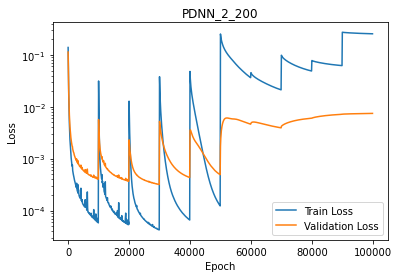

In [10]:
fig, ax = Training.plot_loss(pdnn_trainer, pdnn_net)

#### 4.5.3 Train PRNN

In [24]:
input_normalization_prnn = Normalization.MinMaxNormalization(input_normalization=True)
output_normalization_prnn = Normalization.MinMaxNormalization()

omega = 1.
prnn_net  = NN.RONN(f"PRNN_{omega}", problem, reduction_method, n_hidden=2, n_neurons=200)
prnn_loss = Losses.PRNN_Loss(prnn_net, output_normalization_prnn, omega=omega)
data      = RONNData.RONNDataLoader(prnn_net, validation_proportion=0.2,
                                    num_without_snapshots=225)
optimizer = torch.optim.Adam(prnn_net.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99999)

prnn_trainer = Training.PRNNTrainer(
    prnn_net, data, prnn_loss, optimizer, scheduler,
    input_normalization_prnn, num_epochs=100000
)

loaded, starting_epoch = IO.initialize_parameters(
    prnn_net, data, prnn_trainer, optimizer
)

In [25]:
prnn_trainer.train()

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
0 18.083883710488198 	Loss(validation) = 9.86301861416638
100 0.6302145500829429 	Loss(validation) = 0.7225560963785003
200 0.30095576717436934 	Loss(validation) = 0.3645061000452575
300 0.18726777152899354 	Loss(validation) = 0.24015018094310914
400 0.14282546106346933 	Loss(validation) = 0.18492133992722234
500 0.11470994979376885 	Loss(validation) = 0.15072574280939963
600 0.09609983995439907 	Loss(validation) = 0.12824059676410704
700 0.08322933707977537 	Loss(validation) = 0.11281020498258226
800 0.07543502961491097 	Loss(validation) = 0.10210735079913487
900 0.06544346849378506 	Loss(validation) = 0.09279047518853989
1000 0.07987026559626426 	Loss(validation) = 0.08967953972801684
1100 0.052832204558281054 	Loss(validation) = 0.08032713692558023
1200 0.047933252236530555 	Loss(validation) = 0.075975211871

12200 0.0036381725719032048 	Loss(validation) = 0.027034305987413937
12300 0.00243386499619435 	Loss(validation) = 0.02561157674689126
12400 0.002663629526039854 	Loss(validation) = 0.025639316751711008
12500 0.0042897573141135355 	Loss(validation) = 0.025930226402680126
12600 0.002451027478538298 	Loss(validation) = 0.02484174584058042
12700 0.004790878325783166 	Loss(validation) = 0.025075286432803285
12800 0.0022626523116151837 	Loss(validation) = 0.02521394757822259
12900 0.00282395519021082 	Loss(validation) = 0.026507977513485048
13000 0.009578740651376157 	Loss(validation) = 0.032366788259999314
13100 0.0023576956311546116 	Loss(validation) = 0.024868063316141446
13200 0.0021788921769375007 	Loss(validation) = 0.02511029429311058
13300 0.002224020508914507 	Loss(validation) = 0.02537850942466336
13400 0.0026036195253577358 	Loss(validation) = 0.02564819304641263
13500 0.002279629904498361 	Loss(validation) = 0.024724922974330064
13600 0.0027343776072100484 	Loss(validation) = 0.

24300 0.0016271707614507846 	Loss(validation) = 0.025851215689045273
24400 0.0015363265066426044 	Loss(validation) = 0.02519179707298559
24500 0.0010907196627290157 	Loss(validation) = 0.024830160984549186
24600 0.0012464576212720658 	Loss(validation) = 0.025321748832191095
24700 0.001140322882633598 	Loss(validation) = 0.025492815701662983
24800 0.0011866079668758633 	Loss(validation) = 0.02503940300801993
24900 0.0025441804781464097 	Loss(validation) = 0.02604309359606982
25000 0.0011438088776299135 	Loss(validation) = 0.025509923036193843
25100 0.0027361682471262897 	Loss(validation) = 0.024280826505294506
25200 0.0013009463552703677 	Loss(validation) = 0.02565135526251253
25300 0.0012447252451550186 	Loss(validation) = 0.025221129713774597
25400 0.001051383375921569 	Loss(validation) = 0.025189538427179525
25500 0.0010926977768664402 	Loss(validation) = 0.025219325190089313
25600 0.0031388484476128887 	Loss(validation) = 0.025689213590820343
25700 0.002345371249890688 	Loss(validat

36300 0.0007813387549765705 	Loss(validation) = 0.02464660385031328
36400 0.0011563467340775001 	Loss(validation) = 0.024105258787357142
36500 0.0008024836899825499 	Loss(validation) = 0.025003865623421332
36600 0.0008108856573589688 	Loss(validation) = 0.02454006117013823
36700 0.001463819900549736 	Loss(validation) = 0.024229959546073963
36800 0.0007306109776268921 	Loss(validation) = 0.024904193311950856
36900 0.0007114086696029685 	Loss(validation) = 0.024987492438151526
37000 0.002008247842995446 	Loss(validation) = 0.024911532762967772
37100 0.0013397098608803194 	Loss(validation) = 0.025620205103863074
37200 0.000770958851556302 	Loss(validation) = 0.025382721031026404
37300 0.0006987981962100855 	Loss(validation) = 0.024874275104248833
37400 0.0016135346550589116 	Loss(validation) = 0.023932874679220582
37500 0.001059552841615657 	Loss(validation) = 0.024690669110488974
37600 0.000721270121024171 	Loss(validation) = 0.024782041921792966
37700 0.0007051121259245576 	Loss(validat

48300 0.0009197111964149649 	Loss(validation) = 0.025991300939527465
48400 0.0011517163910432684 	Loss(validation) = 0.024495418849965728
48500 0.000690698538397432 	Loss(validation) = 0.024684033831610254
48600 0.0010944723358612234 	Loss(validation) = 0.02620506692175206
48700 0.0006289179430341914 	Loss(validation) = 0.025087971960533785
48800 0.0005450598972670166 	Loss(validation) = 0.025200926160347924
48900 0.001882460431025333 	Loss(validation) = 0.027797901947106244
49000 0.0005651886694292691 	Loss(validation) = 0.024891257366757118
49100 0.0008606687436106182 	Loss(validation) = 0.024553697389560435
49200 0.0007758533915884146 	Loss(validation) = 0.024838162991916508
49300 0.0005515763659963335 	Loss(validation) = 0.024493780774158955
49400 0.0005128933284732084 	Loss(validation) = 0.02510925613623098
49500 0.0005116397646689908 	Loss(validation) = 0.024995608034670012
49600 0.0007186403957950778 	Loss(validation) = 0.02433236313013717
49700 0.0006025969243250856 	Loss(valid

60300 0.0004148735857531217 	Loss(validation) = 0.02530523840063231
60400 0.0004256726769904538 	Loss(validation) = 0.025121232559450264
60500 0.0005272614130631257 	Loss(validation) = 0.025521635495998684
60600 0.0006162668769428785 	Loss(validation) = 0.0252055142787808
60700 0.0005077515377490307 	Loss(validation) = 0.025197275808734106
60800 0.000410295393712992 	Loss(validation) = 0.025333878949623877
60900 0.00041872834880088015 	Loss(validation) = 0.02535986902135191
61000 0.0005399185180887539 	Loss(validation) = 0.026248631326987352
61100 0.0008234004537310262 	Loss(validation) = 0.024535016022912713
61200 0.0017701403624558272 	Loss(validation) = 0.023907609352568623
61300 0.0005253188329766172 	Loss(validation) = 0.02549498044462481
61400 0.00047459133472609754 	Loss(validation) = 0.025235171851871845
61500 0.0009291114536794758 	Loss(validation) = 0.026633216579125218
61600 0.0005788578003391154 	Loss(validation) = 0.025092681625337593
61700 0.00043015916541842836 	Loss(val

72300 0.0004086701219204454 	Loss(validation) = 0.02522136787545473
72400 0.0004225577758934896 	Loss(validation) = 0.024930110647959355
72500 0.0014291088739779247 	Loss(validation) = 0.026881827026109747
72600 0.0003678930852579344 	Loss(validation) = 0.025428066709853075
72700 0.0005940086589473719 	Loss(validation) = 0.027324076432862065
72800 0.00038102139904426833 	Loss(validation) = 0.025632734312623723
72900 0.0007468047509038078 	Loss(validation) = 0.027241209228997983
73000 0.0011762789582852847 	Loss(validation) = 0.02770419635325935
73100 0.00036525839278741363 	Loss(validation) = 0.02564985038497815
73200 0.000374582144895279 	Loss(validation) = 0.02562809321643095
73300 0.00046062790142330874 	Loss(validation) = 0.026383495381205976
73400 0.00035416114513454953 	Loss(validation) = 0.025534757671796613
73500 0.0004204815252761807 	Loss(validation) = 0.02517127040999687
73600 0.00041276074013085263 	Loss(validation) = 0.02534611291505061
73700 0.0006447360567467305 	Loss(va

84300 0.00046193472609816694 	Loss(validation) = 0.026893868805515673
84400 0.00038747446243981193 	Loss(validation) = 0.02574288088060289
84500 0.00032031571866062 	Loss(validation) = 0.02578549105588303
84600 0.000497321648908167 	Loss(validation) = 0.02577829217008743
84700 0.0004627381461651793 	Loss(validation) = 0.026281191755106997
84800 0.0003154734154915914 	Loss(validation) = 0.025860926561765203
84900 0.00034945063365799024 	Loss(validation) = 0.026187853845835867
85000 0.0003573623618156722 	Loss(validation) = 0.02571475602368421
85100 0.0003961303216162076 	Loss(validation) = 0.025743202129649322
85200 0.0014649296722561741 	Loss(validation) = 0.024822708603121288
85300 0.0015388781224872838 	Loss(validation) = 0.02612463585227342
85400 0.001178608375415985 	Loss(validation) = 0.02523012603680363
85500 0.0009806542725645552 	Loss(validation) = 0.026459648014452244
85600 0.0006489686682573741 	Loss(validation) = 0.024773451078074195
85700 0.00039813830288048136 	Loss(valida

96300 0.0004392547125942032 	Loss(validation) = 0.026887606958265833
96400 0.0005178921714788073 	Loss(validation) = 0.02640491989860348
96500 0.0002560818721302351 	Loss(validation) = 0.02557169486262719
96600 0.00025514287258770547 	Loss(validation) = 0.02574599845224008
96700 0.0003020810653340095 	Loss(validation) = 0.02547814897034616
96800 0.00028130039186954463 	Loss(validation) = 0.02605626650472067
96900 0.0002521475392966036 	Loss(validation) = 0.025747066648173434
97000 0.0009458671752782818 	Loss(validation) = 0.027995647914508377
97100 0.0004891871368108384 	Loss(validation) = 0.026051670380541136
97200 0.0002609390119136133 	Loss(validation) = 0.025930617059077718
97300 0.00041733785539821205 	Loss(validation) = 0.026435225967731575
97400 0.00045651258349287214 	Loss(validation) = 0.025946391916427947
97500 0.0002674078656437845 	Loss(validation) = 0.025733885462058
97600 0.00028717495939992144 	Loss(validation) = 0.025683935650365333
97700 0.0006238931522788211 	Loss(val

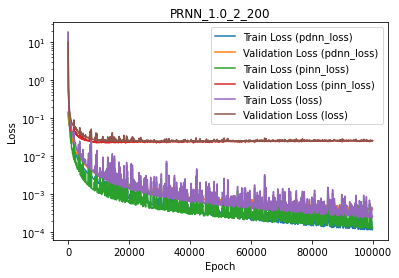

In [26]:
fig, ax = Training.plot_loss(prnn_trainer, prnn_net, separate=True)

#### 4.5.4 Train PINN

In [8]:
input_normalization_pinn = Normalization.MinMaxNormalization(input_normalization=True)
output_normalization_pinn = Normalization.MinMaxNormalization()

pinn_net  = NN.RONN(f"PINN", problem, reduction_method, n_hidden=2, n_neurons=200)
pinn_loss = Losses.PINN_Loss(pinn_net, output_normalization_pinn)
data      = RONNData.RONNDataLoader(pinn_net, validation_proportion=0.2,
                                    num_without_snapshots=225)
optimizer = torch.optim.Adam(pinn_net.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99999)

pinn_trainer = Training.PINNTrainer(
    pinn_net, data, pinn_loss, optimizer, scheduler,
    input_normalization_pinn, num_epochs=100000
)

loaded, starting_epoch = IO.initialize_parameters(
    pinn_net, data, pinn_trainer, optimizer
)

In [9]:
pinn_trainer.train()

Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
Operator 'bt_restricted' not implemented. Continuing without operator 'bt_restricted'...
0 18.917511214246534 	Loss(validation) = 7.214823809026534
100 0.509526747299734 	Loss(validation) = 0.5116884000327581
200 0.2619576810820593 	Loss(validation) = 0.26664521936150304
300 0.1452447938244813 	Loss(validation) = 0.15514286401081528
400 0.08887505517827253 	Loss(validation) = 0.10383332952834404
500 0.06266084905526546 	Loss(validation) = 0.0800996267135882
600 0.04750233007982762 	Loss(validation) = 0.06533196750939572
700 0.0376303612907955 	Loss(validation) = 0.05510388281538903
800 0.030885934430471475 	Loss(validation) = 0.0477574709981404
900 0.026331154214739184 	Loss(validation) = 0.04277372489176735
1000 0.022639741780141342 	Loss(validation) = 0.03835817522862586
1100 0.020054275468701196 	Loss(validation) = 0.035355411580917095
1200 0.01771866150475938 	Loss(validation) = 0.0326937781284

12000 0.000778275210817679 	Loss(validation) = 0.01200258212207065
12100 0.001609020651541314 	Loss(validation) = 0.012169200204232618
12200 0.0006621353768911299 	Loss(validation) = 0.011850812540011867
12300 0.0011058626342646057 	Loss(validation) = 0.012145763960769676
12400 0.000681164028711964 	Loss(validation) = 0.011950138356553636
12500 0.003984384221211865 	Loss(validation) = 0.013564714744354403
12600 0.0006234654048156936 	Loss(validation) = 0.012053292078904088
12700 0.0006306889696771547 	Loss(validation) = 0.012175381798900216
12800 0.0023985735018623284 	Loss(validation) = 0.012906947580464574
12900 0.0030924223682948027 	Loss(validation) = 0.017030931008901348
13000 0.0033365624755744257 	Loss(validation) = 0.014215881190681078
13100 0.0013384518227906462 	Loss(validation) = 0.013522879352747902
13200 0.0006665607215499849 	Loss(validation) = 0.012033368145740696
13300 0.002888915293530477 	Loss(validation) = 0.012875861474522797
13400 0.002097309406749621 	Loss(validat

23900 0.0004968440622877187 	Loss(validation) = 0.01434322071384602
24000 0.0009821580740800244 	Loss(validation) = 0.014803246886152015
24100 0.0002515905547064602 	Loss(validation) = 0.013850900027971617
24200 0.00021830143146431253 	Loss(validation) = 0.013970100137774026
24300 0.001665383998800152 	Loss(validation) = 0.016205676718139175
24400 0.0005018515846022513 	Loss(validation) = 0.01453918525502022
24500 0.0004630901463364891 	Loss(validation) = 0.01423651713622313
24600 0.0005382289876289791 	Loss(validation) = 0.014027274350801913
24700 0.0009534376955501766 	Loss(validation) = 0.014445029335010557
24800 0.00020276162111082445 	Loss(validation) = 0.014125451879437383
24900 0.0017592579903017503 	Loss(validation) = 0.01547500032181006
25000 0.0003540445642277515 	Loss(validation) = 0.01406994728877104
25100 0.00024039080882281696 	Loss(validation) = 0.014035808983303177
25200 0.0002899486916981122 	Loss(validation) = 0.014466177573547281
25300 0.0003435052824895136 	Loss(val

35800 0.00030266943926385444 	Loss(validation) = 0.015583765711112293
35900 0.0009546934543441475 	Loss(validation) = 0.016182455962707204
36000 0.001155045742963402 	Loss(validation) = 0.015448984573215347
36100 0.0005037881494974645 	Loss(validation) = 0.015977760784996124
36200 0.0003626311912775926 	Loss(validation) = 0.01556175622160051
36300 0.0003880143255143119 	Loss(validation) = 0.016666002626850616
36400 0.0007984467242276676 	Loss(validation) = 0.015530199379033077
36500 0.0003812242383270925 	Loss(validation) = 0.01601400204677266
36600 0.00032698025560499235 	Loss(validation) = 0.01626807075714633
36700 0.0003671809851496421 	Loss(validation) = 0.01657635833793097
36800 0.0005820308842702583 	Loss(validation) = 0.016612552101928562
36900 0.0007235850197601567 	Loss(validation) = 0.01627249579484149
37000 0.00014136245823534628 	Loss(validation) = 0.015766973835796602
37100 0.00015893287780744997 	Loss(validation) = 0.015573462582037075
37200 0.0004443168298300137 	Loss(va

47700 0.00013701919962275344 	Loss(validation) = 0.01636784609366364
47800 0.00017294536580018062 	Loss(validation) = 0.016949421438456232
47900 0.0002501129230277123 	Loss(validation) = 0.01685184841440335
48000 6.459130828964839e-05 	Loss(validation) = 0.01656992993779716
48100 9.792059753427706e-05 	Loss(validation) = 0.016708645439468244
48200 7.727821799624294e-05 	Loss(validation) = 0.01654084629504331
48300 8.17927881724309e-05 	Loss(validation) = 0.016437249466987987
48400 6.815629771425153e-05 	Loss(validation) = 0.01669196231392915
48500 7.550015479525251e-05 	Loss(validation) = 0.01649562009303818
48600 7.529955731305279e-05 	Loss(validation) = 0.016636923691044695
48700 0.00011857001571590847 	Loss(validation) = 0.016661243065713753
48800 0.0003067184916432648 	Loss(validation) = 0.016371700735722142
48900 0.00013544949003321902 	Loss(validation) = 0.016687547863239165
49000 0.0006100750448433271 	Loss(validation) = 0.01737466879088628
49100 0.0003587585691755001 	Loss(vali

59600 0.00030759866629424804 	Loss(validation) = 0.017967924953619548
59700 0.00012994357146062127 	Loss(validation) = 0.016835836696580005
59800 0.00031359182481728224 	Loss(validation) = 0.0173640100327424
59900 9.436768753298279e-05 	Loss(validation) = 0.017432497716365195
60000 0.00020537369660303547 	Loss(validation) = 0.01738504943290971
60100 8.875796586851602e-05 	Loss(validation) = 0.01729331192813487
60200 0.00024734728676752984 	Loss(validation) = 0.01716692189196069
60300 0.00018510107534314168 	Loss(validation) = 0.017525977777879297
60400 6.228271966971684e-05 	Loss(validation) = 0.017453117225694804
60500 0.0002313921322777972 	Loss(validation) = 0.017767977836657487
60600 0.0004299959991310356 	Loss(validation) = 0.01742079759810792
60700 0.00015606351955670667 	Loss(validation) = 0.017777291535847946
60800 0.000514423255698474 	Loss(validation) = 0.01690239630130814
60900 0.00010959281233502717 	Loss(validation) = 0.017350752721472747
61000 7.113216522949069e-05 	Loss(

71500 0.00031184689118454864 	Loss(validation) = 0.017949443474457767
71600 0.0004129680432438952 	Loss(validation) = 0.018182656125524756
71700 0.00025672974009008094 	Loss(validation) = 0.018443495327609305
71800 7.369987557007711e-05 	Loss(validation) = 0.018047402986516022
71900 0.0001077859574826633 	Loss(validation) = 0.018092756271938043
72000 0.00015019391163085833 	Loss(validation) = 0.017573366085419068
72100 4.714320071836811e-05 	Loss(validation) = 0.018033226113843743
72200 8.201391426773872e-05 	Loss(validation) = 0.018091890261630217
72300 0.00032928790665666315 	Loss(validation) = 0.018375659733495208
72400 0.0001963766770029023 	Loss(validation) = 0.018217723611277815
72500 5.198913388710887e-05 	Loss(validation) = 0.01787592142066221
72600 3.4348839328985346e-05 	Loss(validation) = 0.017924507825742654
72700 7.41339852696377e-05 	Loss(validation) = 0.017994253651539983
72800 4.559931472604238e-05 	Loss(validation) = 0.0179434895786721
72900 8.616569874696334e-05 	Loss

83400 7.561438040605159e-05 	Loss(validation) = 0.018139105222168474
83500 2.816091567578058e-05 	Loss(validation) = 0.018418768018224636
83600 2.569551410763415e-05 	Loss(validation) = 0.018364115935075226
83700 2.647242852592732e-05 	Loss(validation) = 0.018342254742576537
83800 2.6413532867370328e-05 	Loss(validation) = 0.018390177489899334
83900 3.0110320776960327e-05 	Loss(validation) = 0.01839964315330995
84000 3.8881346641346e-05 	Loss(validation) = 0.018293488033432538
84100 0.0002847511709839182 	Loss(validation) = 0.018418590130781568
84200 7.710050786016938e-05 	Loss(validation) = 0.0185843191660698
84300 0.00019971562332395476 	Loss(validation) = 0.018579440774022727
84400 3.05358289080316e-05 	Loss(validation) = 0.018380923022291096
84500 2.6936616470139782e-05 	Loss(validation) = 0.01847372095092884
84600 8.867574371802345e-05 	Loss(validation) = 0.018715889830569328
84700 2.5201360627146545e-05 	Loss(validation) = 0.018366338231961103
84800 0.0001224871173831349 	Loss(va

95300 0.0003973095637527936 	Loss(validation) = 0.018716113912899495
95400 0.00013933407363341427 	Loss(validation) = 0.01868035847856381
95500 0.0003255519428507376 	Loss(validation) = 0.019015895941654194
95600 3.068719042871985e-05 	Loss(validation) = 0.018620233776085647
95700 4.112815704645711e-05 	Loss(validation) = 0.018770465533926618
95800 0.00011443646697102114 	Loss(validation) = 0.018658769419294556
95900 2.402157009888093e-05 	Loss(validation) = 0.01864783432891422
96000 4.4033858080199204e-05 	Loss(validation) = 0.018836424458596273
96100 3.2734241796716515e-05 	Loss(validation) = 0.018742891326766827
96200 0.00023961045295961184 	Loss(validation) = 0.01886013614658894
96300 0.00011632801562366428 	Loss(validation) = 0.018961663704386324
96400 0.00010689953593262634 	Loss(validation) = 0.018346445014536743
96500 5.423981136392063e-05 	Loss(validation) = 0.018532773405791007
96600 0.0001996449440796368 	Loss(validation) = 0.019149819283994483
96700 7.955466528622664e-05 	L

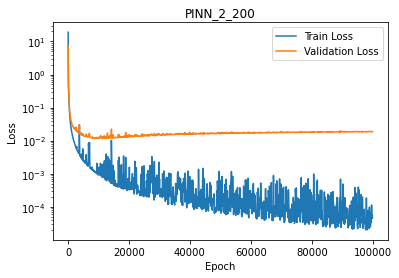

In [10]:
fig, ax = Training.plot_loss(pinn_trainer, pinn_net)

### 4.6. Perform an error analysis

In [12]:
np.random.seed(42)
reduction_method.initialize_testing_set(100, sampling=LinearlyDependentUniformDistribution())
test_mu = torch.tensor(reduction_method.testing_set)

#### 4.6.1 Greedy PDNN-PINN Error Analysis

In [21]:
pdnn_net.load_best_weights()
_ = ErrorAnalysis.error_analysis_fixed_net(
    pdnn_net, test_mu, input_normalization_pdnn, output_normalization_pdnn
)

#################################### N = 59 ####################################
ERROR	NN-HF			NN-RO			RO-HF
min	0.0006833252863310602	0.000479351390987402	0.0004987328216638703
mean	0.002852677533722264	0.0027233653476977744	0.0012831954669361948
max	0.01548306523226987	0.016163652955470276	0.004560069082074133


#### 4.6.2 PRNN Error Analysis

In [27]:
prnn_net.load_best_weights()
_ = ErrorAnalysis.error_analysis_fixed_net(
    prnn_net, test_mu, input_normalization_prnn, output_normalization_prnn
)

#################################### N = 59 ####################################
ERROR	NN-HF			NN-RO			RO-HF
min	0.0012831085158159594	0.0011754073187878803	0.0004987328216638703
mean	0.010197147901829984	0.010223099969485677	0.0012831954669361948
max	0.05131166577308089	0.05255005712961012	0.004560069082074133


#### 4.6.3 PINN Error Analysis

In [13]:
pinn_net.load_best_weights()
_ = ErrorAnalysis.error_analysis_fixed_net(
    pinn_net, test_mu, input_normalization_pinn, output_normalization_pinn
)

#################################### N = 59 ####################################
ERROR	NN-HF			NN-RO			RO-HF
min	0.0027594044987839053	0.0025525143371858596	0.0004987328216638703
mean	0.01970330191518629	0.019594579189458998	0.0012831954669361948
max	0.2386146031230246	0.23969560421644645	0.004560069082074133
